<center>
    <h1>Fruit Inspection - Final Challenge: Kiwi Inspection</h1>
    <h2>Image Processing and Computer Vision</h2>
    <h3>Facundo Nicolas Maidana and Riccardo Spolaor</h3>
    <h4>facundo.maidana@studio.unibo.it; riccardo.spolaor@studio.unibo.it</h4>
</center>

---

This notebook presents the development of a system aimed at locating defects and imperfection in fruits. Each fruit is acquired through a NIR *(Near Infra-Red)* and color camera that present little parallax effect among each other.

The final challenge considers the images in the folder `images/final challenge/`, that illustrate five different kiwis.

| NIR example                   | Colour example                |
|:-----------------------------:|:-----------------------------:|
| 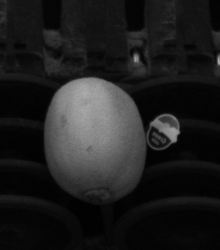 | 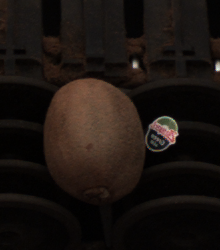 |

It is required to localize eventual defects on the fruits.

*Note: special care should be taken to remove as "background" the dirt on the conveyor as well as the sticker in image `C1_000006`.*

#### Procedure
Although this is an academic project, the working pipeline has been developed considering an industrial setting where the inspection of the fruits has to be carried out by an *online* system. A set of methods have been tested in terms of quality, speed and robustness.

# 00 Prerequisites
The libraries necessary for the task are imported.

In [1]:
%matplotlib inline

import cv2 as cv
import math
import matplotlib.pyplot as plt
import numpy as np
import sys
from time import time
import os

from execute_final_challenge import detect_defects

# Utils libraries
from utils.edge import *
from utils.colour import *
from utils.colour_threshold import *
from utils.threshold import *
from utils.general import *

The cell below illustrates the version of `OpenCV` used for the task.

In [2]:
print(f'Using OpenCV version: {cv.__version__}.')

Using OpenCV version: 4.6.0.


The random seed is set for both the `numpy` and `OpenCV` libraries in order to guarantee reproducibility of results.

In [3]:
SEED = 42

cv.setRNGSeed(SEED)
np.random.seed(SEED)

# 01 Image analysis 
The series of images is firstly imported and plotted.

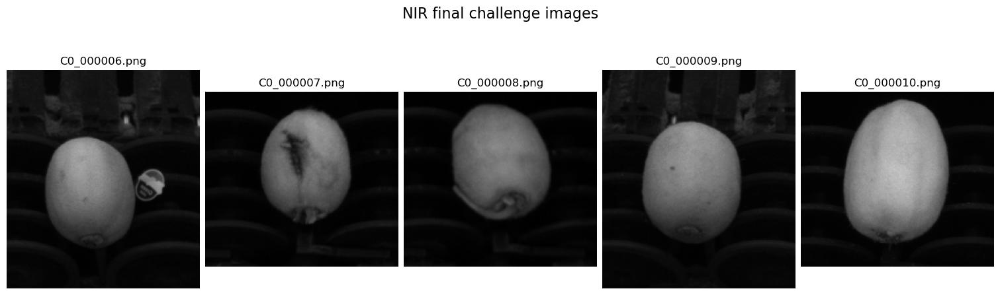

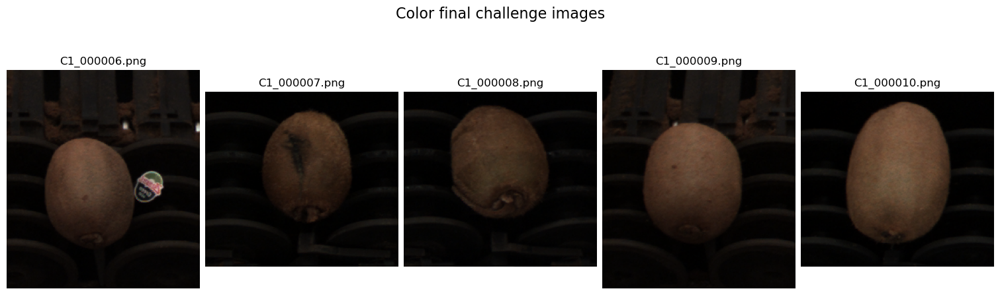

In [4]:
# Create two arrays containing the names of the NIR and color images respectively
nir_names, colour_names = [[f'C{j}_{str(i).zfill(6)}.png' for i in range(6,11)] for j in [0,1]]

# Directory where the images are saved
DIR = '../images/final challenge/'

# Import NIR and color images
nir_imgs = [cv.imread(f'{DIR}{img}', cv.IMREAD_GRAYSCALE) for img in nir_names]
colour_imgs = [cv.imread(f'{DIR}{img}') for img in colour_names]

# Plot the NIR and color images
plot_image_grid(nir_imgs, nir_names, 'NIR final challenge images')
plot_image_grid(colour_imgs, colour_names, 'Color final challenge images')

Then, the parallax between images is observed. The NIR and colour images seem to overlap almost perfectly, therefore the NIR version of the images can be used to obtain the binary masks of the fruit which can be applied even on their colour version.

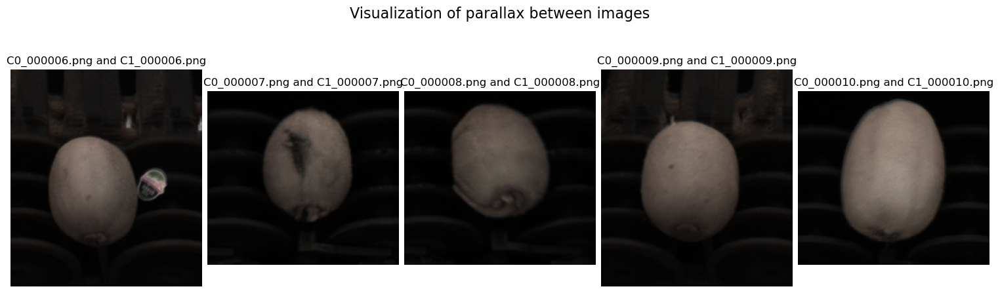

In [5]:
parallaxes = [cv.addWeighted(cv.cvtColor(n, cv.COLOR_GRAY2BGR), 0.5, c, 0.5, 0) 
              for n, c in zip(nir_imgs, colour_imgs)]

plot_image_grid(parallaxes, [f'{n} and {c}' for n, c in zip(nir_names, colour_names)], 
                'Visualization of parallax between images')

The *gray-level histograms* of the NIR images are computed and illustrated.

The plots make it clear that the histograms are not *bimodal*. However, in the range of levels $[0, 50]$ a concentration of pixels is present, which would most probably account for background pixels.

In images *C0_000006* and *C_000009* the concentration of pixels in this range does not define a clear peak, probably due to the presence of the noisy conveyors in the background.

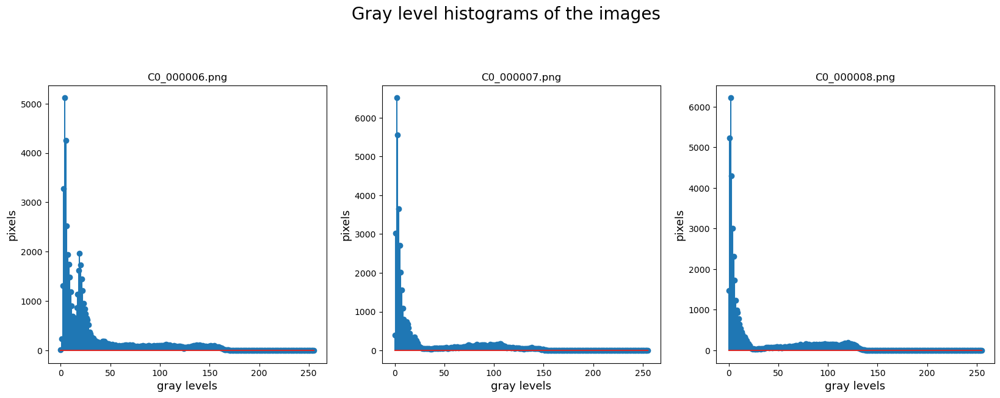

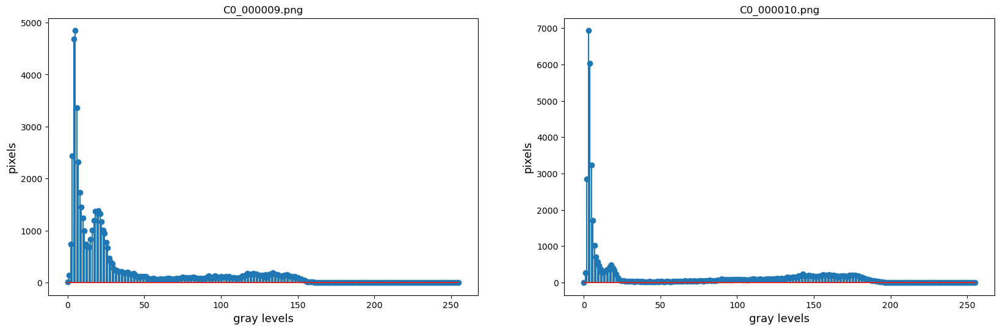

In [6]:
plot_histogram_grid(nir_imgs[:3], nir_names[:3], 'Gray level histograms of the images')
plot_histogram_grid(nir_imgs[3:], nir_names[3:], '')

## 02 Pre-processing
As mentioned in the *First Task*, in order to guarantee better performances in the binarization tasks a pre-processing operation has been applied to the NIR images. It is important to notice that the images of this task do not present an uniform background due to the presence of particularly noisy artefacts corresponding to the conveyor belts in the background.

In particular, two differnt kind of pre-processing techniques have been taken into account and compared in terms of quality and speed:
* *Median Blur* filtering;
* *Non-Local Means filtering*.

## 02.1 Median Blur Filtering
Firstly, a *Median blur* non-linear filter using a kernel of dimension $(7 \times 7)$ has been applied. As specified in the previous tasks, this filter willl guarantee that the details of the image will be blurred and the edges will be preserved.

The results are in line with the observation above, as the images are denoised while the edges are preserved and the artifacts on the background are partially removed.

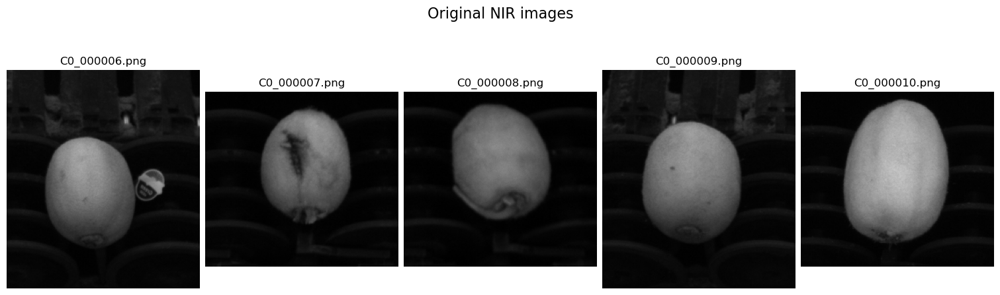

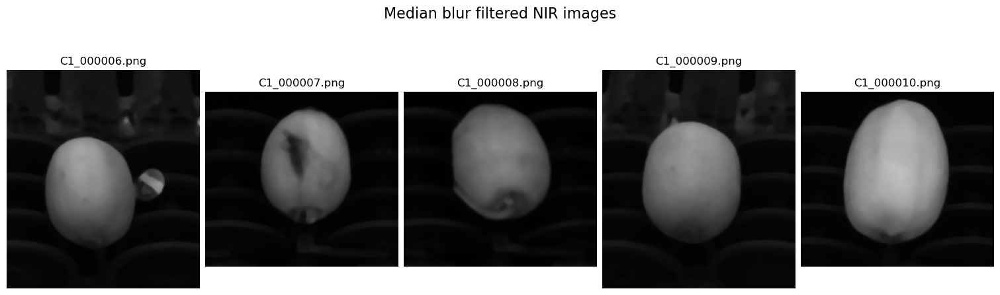

In [7]:
mb_filtered_images = [cv.medianBlur(img, 7) for img in nir_imgs]

plot_image_grid(nir_imgs, nir_names, 'Original NIR images')
plot_image_grid(mb_filtered_images, colour_names, 'Median blur filtered NIR images')

The same technique as the one of the *First Task* and the *Second Task* has been considered in order to segment the fruits from the background, namely *Tweaked Otsu's Algorithm*. For the given problem, a *tweak factor* of value $0.4$ has been chosen.

The results obtained through this approach are satisfactory as in each image the whole fruit is fully segmented from the background in its entirety. 

However, in images *C0_000006.png* and *C0_000009.png* the segmentation is not fully obtained, as a large amount of noisy artifacts of the conveyors in the background are included in the *foreground region* along the fruits and some of these artefacts are attached to the fruits themselves.  

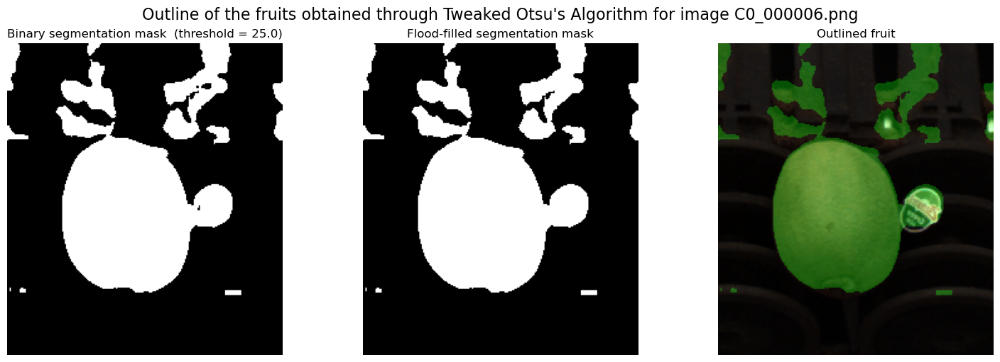

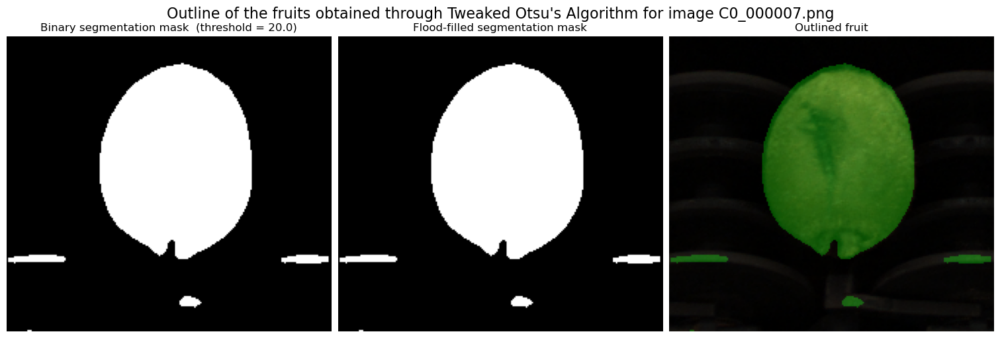

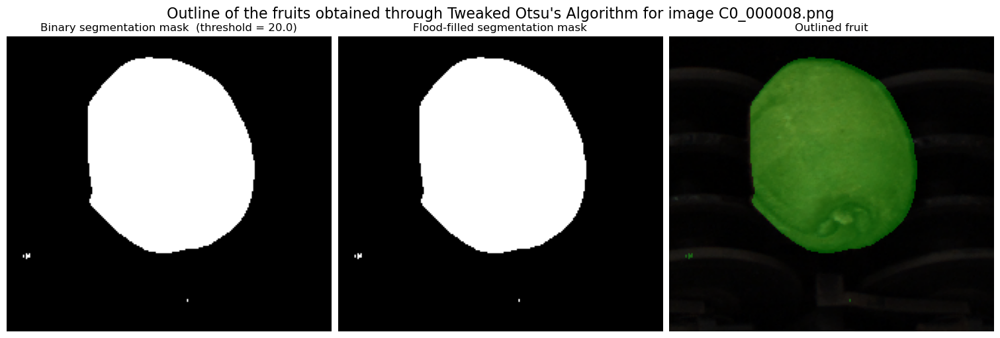

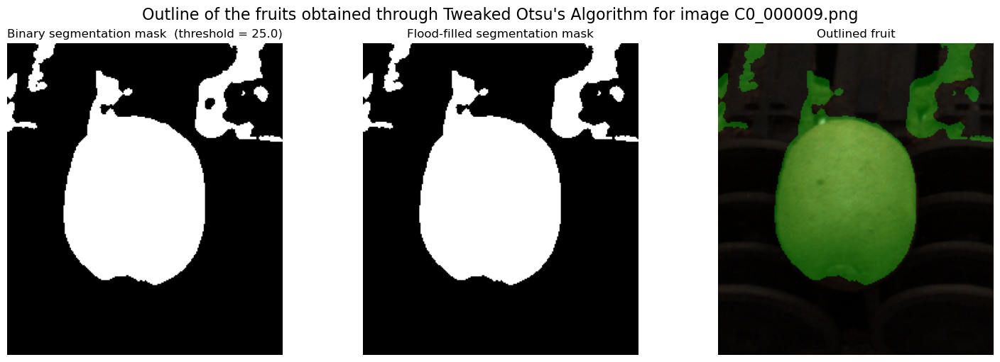

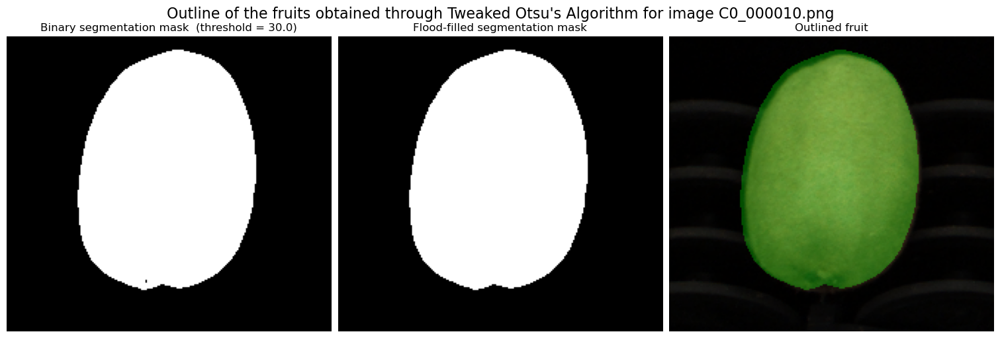

In [8]:
TWEAK_FACTOR = .4

plot_segmentation_process(mb_filtered_images, colour_imgs, nir_names, ThresholdingMethod.TWEAKED_OTSU, tweak_factor=TWEAK_FACTOR)

## 02.2 Non-Local Means Filtering
As the previous preprocessing method (*Median blur*) presents some problem in segmenting the fruits from the background, a *Non-local means* denoising filter is considered and applied to the images.

*Non-local means filtering* is an advanced non-linear filtering method that preserves the edges, while removing noise from the original image. It processes each pixel in the images while considering all the other pixels, which are weighted by similarity with respect to it according to their neighbour region.

Given an image $I$, the output of a pixel $p$, $O(p)$ is given by:
$$O(p) = \sum\limits_{\text{pixel} \ q \in I} w(p,q) \cdot I(q)$$
Where $w(p,q)$ is the weight of pixel $p$ with respect to $q$ according to their similarity in their neighbour region

The usage of the filter with a high strength (parameter `h` of the function `fastNlMeansDenoising`) will blur a great amount of background noise, in spite of also removing details in the image.

The results of the filter are shown below.

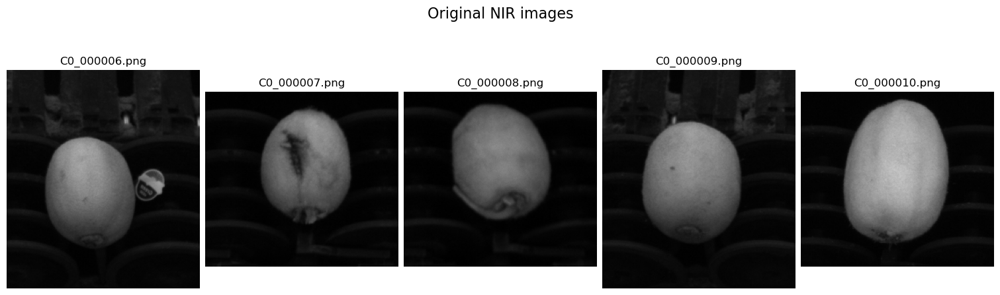

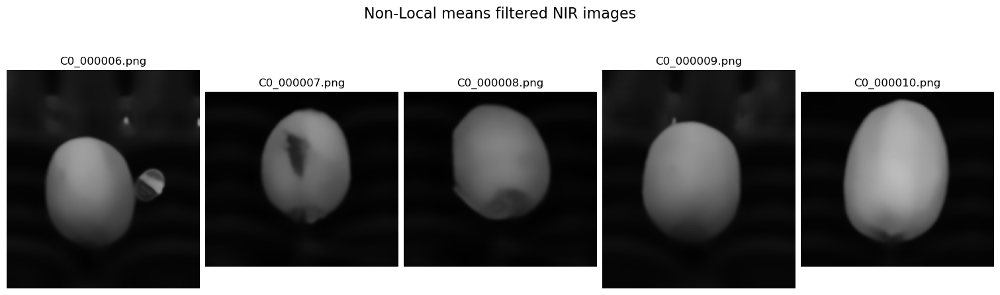

In [9]:
nl_filtered_imgs = [cv.fastNlMeansDenoising(img, h=25) for img in nir_imgs]
plot_image_grid(nir_imgs, nir_names, 'Original NIR images')
plot_image_grid(nl_filtered_imgs, nir_names, 'Non-Local means filtered NIR images')

The fruit are segmented once again by *Tweaked Otsu's Algorithm* with a *tweak factor* of $0.4$.

The segmentation results obtained through this pre-processing are better as for each image the whole fruit is almost fully separated from the background and the conveyor noise is generally less marked. Unfortunately, noisy patches of background noise are still connected to the fruit region in images *C_000006* and *C_000009*.

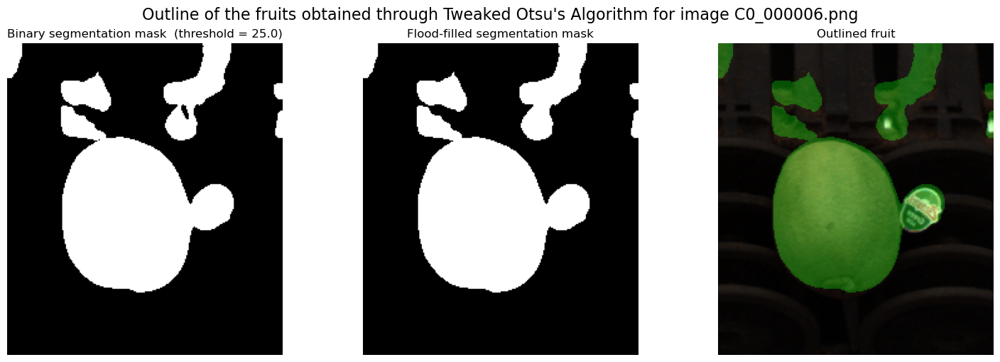

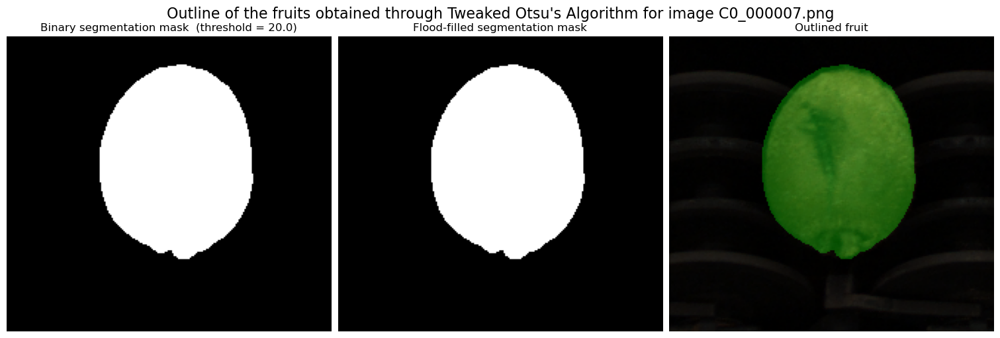

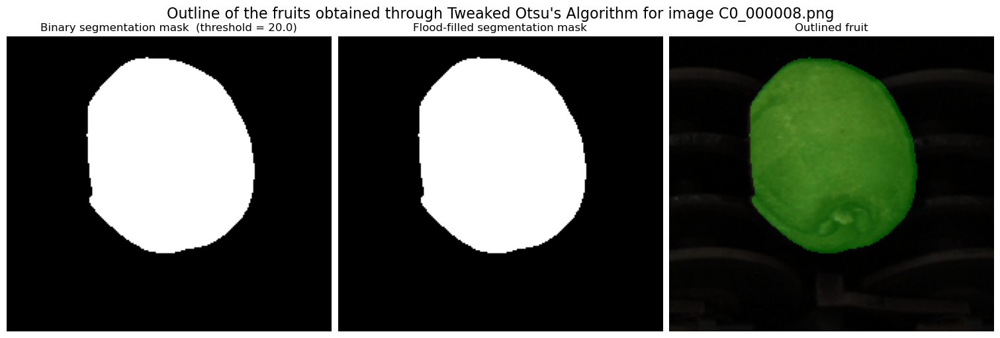

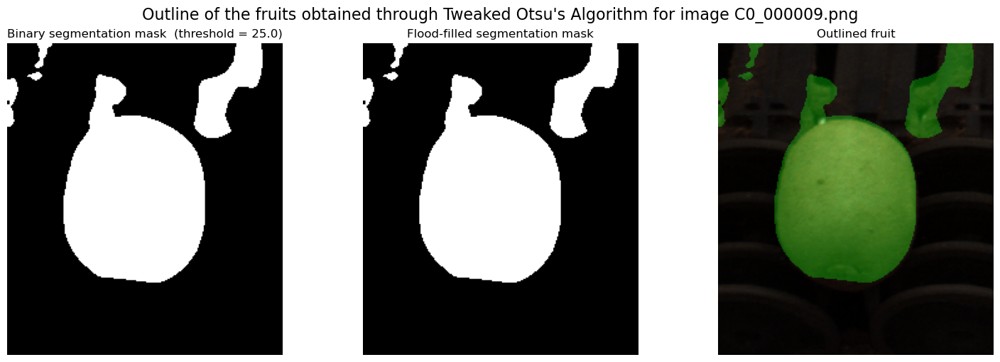

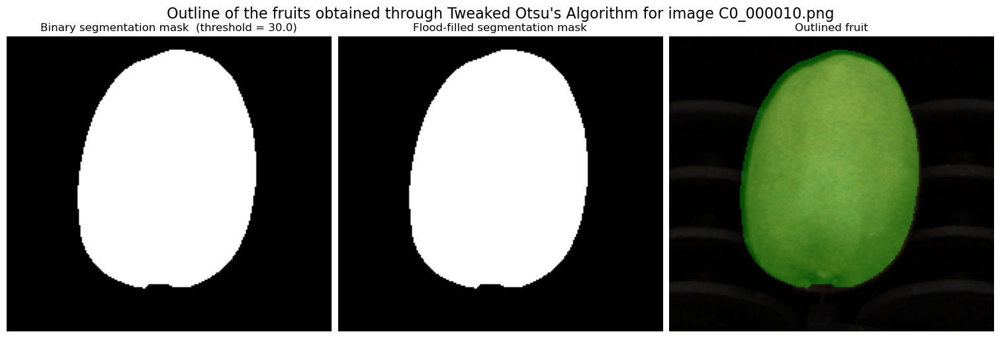

In [10]:
TWEAK_FACTOR = .4
plot_segmentation_process(nl_filtered_imgs, colour_imgs, nir_names, ThresholdingMethod.TWEAKED_OTSU, tweak_factor=TWEAK_FACTOR)

However, the difference in time taken to pre-process the images by the two methods is quietly large. 

*Non-local Means filter* is almost $100$ times slower than *Median Blur* as it takes $\approx 0.1$ seconds to process an image with respect of the $\approx 0.001$ seconds that are spent by the latter.

Due to its severe slowness *Non-local Means filter* cannot be deployed in an *online* system as the one considered in the task.

Furthermore, it does not manage to completely remove the conveyors background noise, so it is discarded for the task in favour of a *Median Blur* pre-processing.

In [11]:
s = time()
for img in nir_imgs * 100:
    cv.medianBlur(img,7)
median_time = time() - s

s = time()
for img in nir_imgs * 100:
    cv.fastNlMeansDenoising(img, h=25)
nl_denoising_time = time() - s

In [12]:
print(f'Time for preprocessing {100 * len(colour_imgs)} images with a median filter: {median_time:.6f}')
print(f'Mean time for preprocessing an image with a median filter: {(median_time / (100 * len(colour_imgs))):.6f}')
print()

print(f'Time for preprocessing {100 * len(colour_imgs)} images with a non-local mean filter: {nl_denoising_time:.6f}')
print(f'Mean time for preprocessing an image with a non-local mean filter: {(nl_denoising_time / (100 * len(colour_imgs))):.6f}')

Time for preprocessing 500 images with a median filter: 0.572985
Mean time for preprocessing an image with a median filter: 0.001146

Time for preprocessing 500 images with a non-local mean filter: 43.261567
Mean time for preprocessing an image with a non-local mean filter: 0.086523


In [13]:
filtered_nir_images = mb_filtered_images

## 03 Segmentation
The masks obtained through binarization with a *Median Blur* pre-processing are applied over the Near Infra-Red images, the Near Infra-Red images pre-processed by *Median Blur* and the colour images and the results are plotted. 

As previously observed, the obtained masks still present some artefacts in the foreground region that should be detatched from the fruits and removed. 

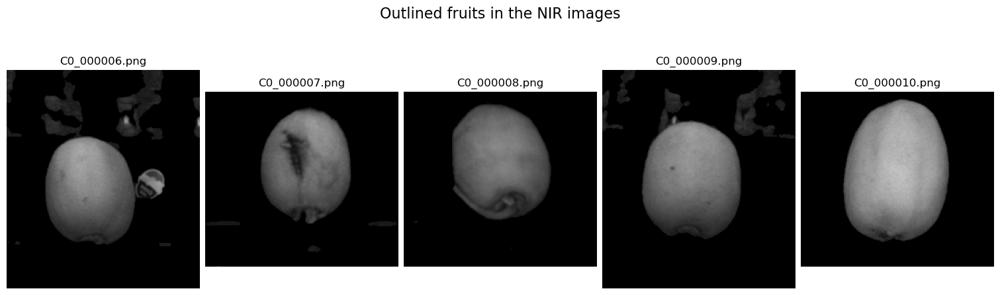

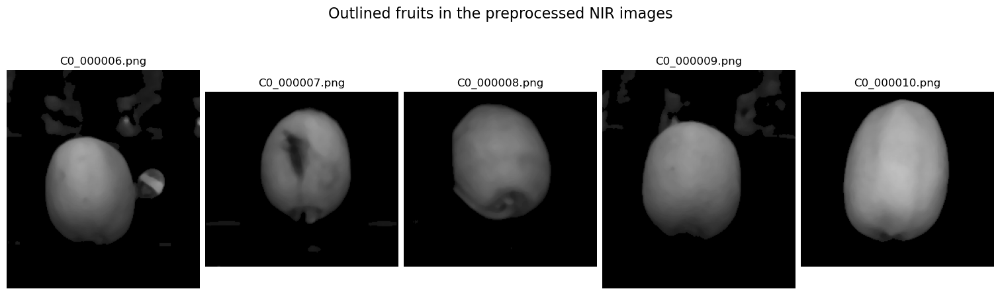

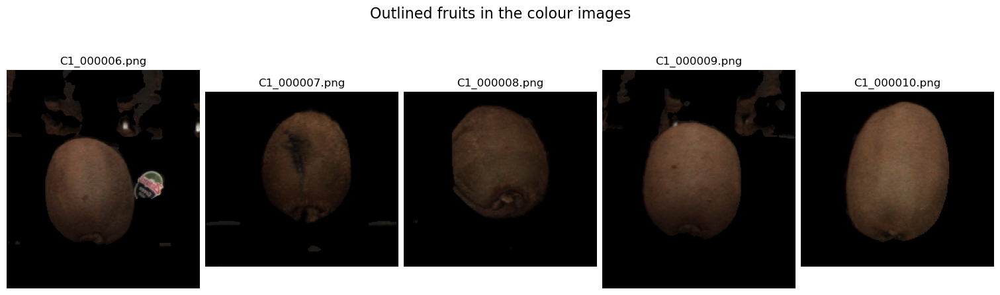

In [14]:
TWEAK_FACTOR = .4
masks = [get_fruit_segmentation_mask(img, ThresholdingMethod.TWEAKED_OTSU, tweak_factor=TWEAK_FACTOR) for img in filtered_nir_images]

masked_nir_imgs = [nir_imgs[i] & masks[i] for i in range(len(masks))]
masked_filtered_imgs = [filtered_nir_images[i] & masks[i] for i in range(len(masks))]
masked_colour_imgs = [colour_imgs[i] &  cv.cvtColor(masks[i], cv.COLOR_GRAY2BGR) for i in range(len(masks))]

plot_image_grid(masked_nir_imgs, nir_names, 'Outlined fruits in the NIR images')
plot_image_grid(masked_filtered_imgs, nir_names, 'Outlined fruits in the preprocessed NIR images')
plot_image_grid(masked_colour_imgs, colour_names, 'Outlined fruits in the colour images')

## 03.1 Artefacts Elimination
The background artefacts connected to the fruit all present an elongated shape that protrudes from their top region vertically. An opening using a structuring element that consider this characteristics would be enough to disconnect them from the fruit.

However, new instances provided to the system could possibly present conveyor noise artefacts that protrudes horizontally from the sides of the fruit and for robustness reasons two different structuring elements are considered for the two openings:
1. An ellipse with shape *(20, 5)*, used to remove possible background noise protruding horizontally from the fruit;
2. An ellipse with shape *(5, 20)*, used to remove possible background noise protruding vertically from the fruit.

This process guarantees that the background elements are detatched from the fruit as seen below. 

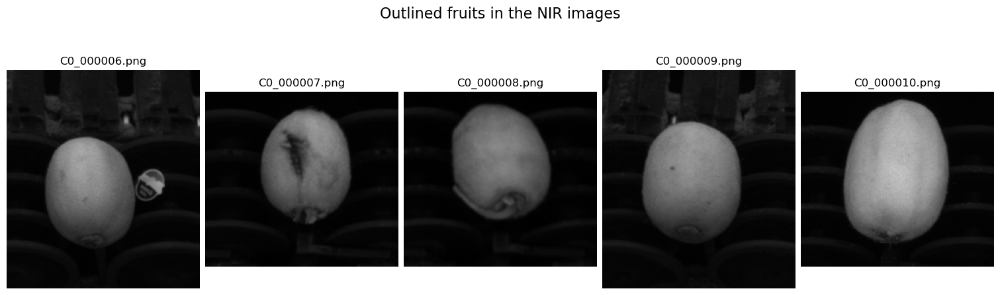

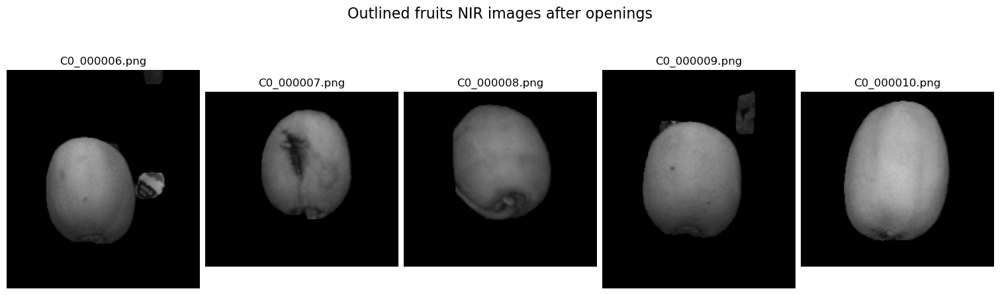

In [15]:
se1 = cv.getStructuringElement(cv.MORPH_ELLIPSE, (20,5))
se2 = cv.getStructuringElement(cv.MORPH_ELLIPSE, (5,20))
masks = [cv.morphologyEx(m, cv.MORPH_OPEN, se1) for m in masks]
masks = [cv.morphologyEx(m, cv.MORPH_OPEN, se2) for m in masks]
masked_nir_imgs = [nir_imgs[i] & masks[i] for i in range(len(masks))]
plot_image_grid(nir_imgs, nir_names, 'Outlined fruits in the NIR images')
plot_image_grid(masked_nir_imgs, nir_names, 'Outlined fruits NIR images after openings')

Afterwards, the detatched noise is completely removed from the foreground by computing the contours of the binary segmentation mask and fill the pixels inside the largest one, that corresponds to the contour of the fruit.

The results are illustrated below. It can be observed that all the fruits are correctly outlined without the presence of noisy elements with the exception of image *C_000006*, which still presents an unwanted sticker.

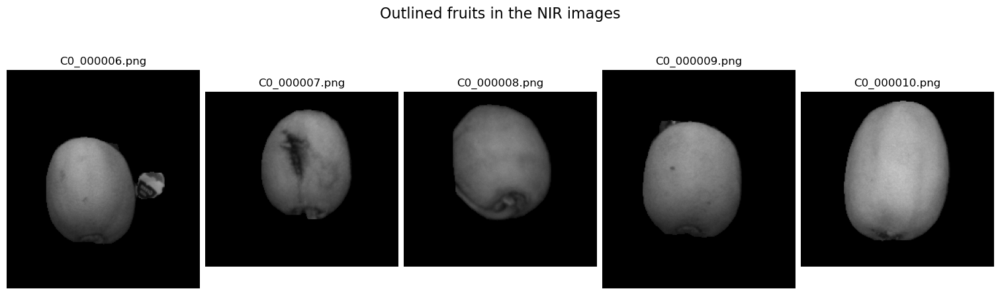

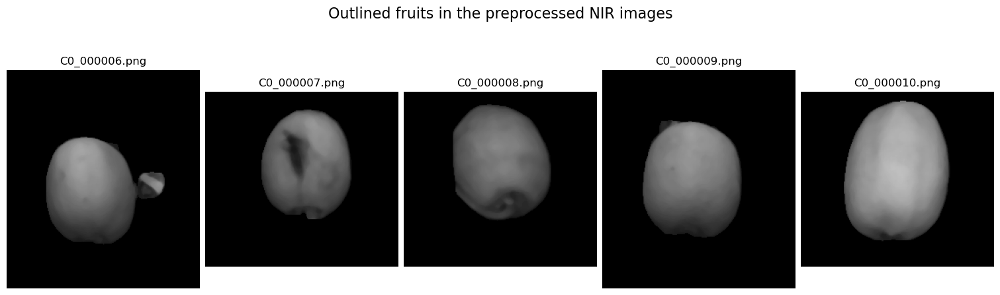

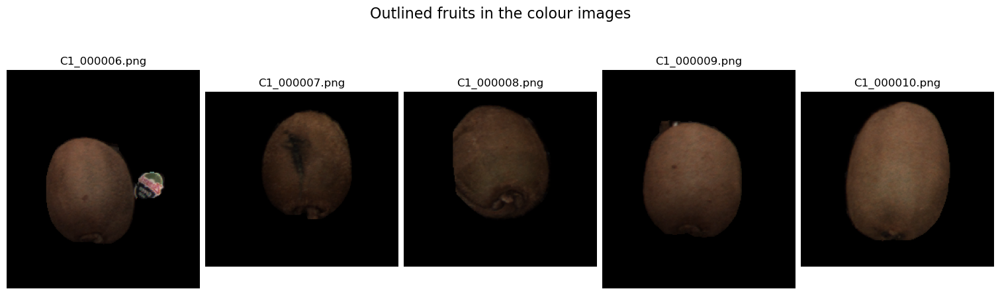

In [16]:
masks = [get_largest_blob_in_mask(m) for m in masks]

masked_nir_imgs = [apply_mask_to_image(img, m) for img, m in zip(nir_imgs, masks)]
masked_filtered_imgs = [apply_mask_to_image(img, m) for img, m in zip(filtered_nir_images, masks)]
masked_colour_imgs = [apply_mask_to_image(img, m) for img, m in zip(colour_imgs, masks)]

plot_image_grid(masked_nir_imgs, nir_names, 'Outlined fruits in the NIR images')
plot_image_grid(masked_filtered_imgs, nir_names, 'Outlined fruits in the preprocessed NIR images')
plot_image_grid(masked_colour_imgs, colour_names, 'Outlined fruits in the colour images')

## 03.2 Sticker Removal
In order to remove the sticker in image *C_000006*, a segmentation of the fruit according to the *Mahalanobis distance* from a reference colour of the kiwis is performed in a similar fashion to the *Second Task*.

The reason behind such choice is related to the fact that the sticker intuitively presents colours which are largely different than the ones of the kiwis.

Scale and intensity invariant object detection techniques were originally considered in order to match a template of the sticker in the images, but lately discarded as the object detection is based on a single sticker template. If different stickers are introduced in the system they would not be found by the algorithm.

On the other hand, a colour segmentation approach would manage to separate even different stickers than the one provided, as the *Mahalanobis distance* is computed with respect to a reference colour of the kiwis and not a reference colour of a particular sticker.

The colour images are pre-processed through a *Bilateral filter* using kernel of dimension $(7 \times 7)$ and spatial standard deviation ($\sigma_s$) and intensity standard deviation ($\sigma_r$) equal to $75$ for the same reasons specified in the *Second Task*.

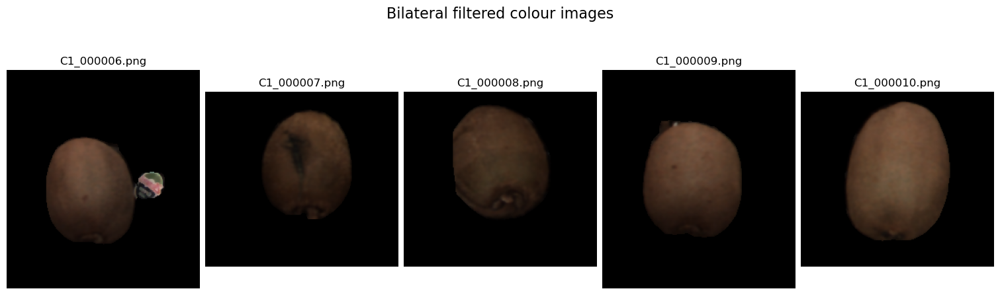

In [17]:
filtered_colour_images = [cv.bilateralFilter(img, d=5, sigmaColor=75, sigmaSpace=75) for img in colour_imgs]
masked_colour_imgs = [apply_mask_to_image(img, m) for img, m in zip(filtered_colour_images, masks)]

plot_image_grid(masked_colour_imgs, colour_names, 'Bilateral filtered colour images')

A three-dimensional plot of the colour distribution in the *BGR* space of the pixels of the kiwi in image *C_000010* and the sticker are presented.

The resulting plots confirm the intuition that the colour distribution of the kiwis and the one of the sticker are pretty different.

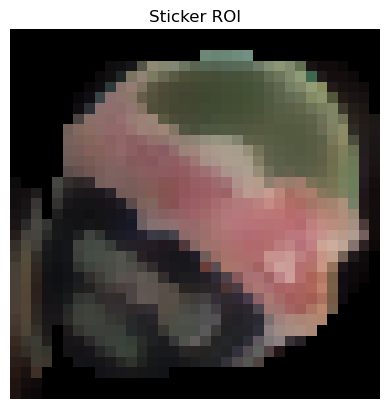

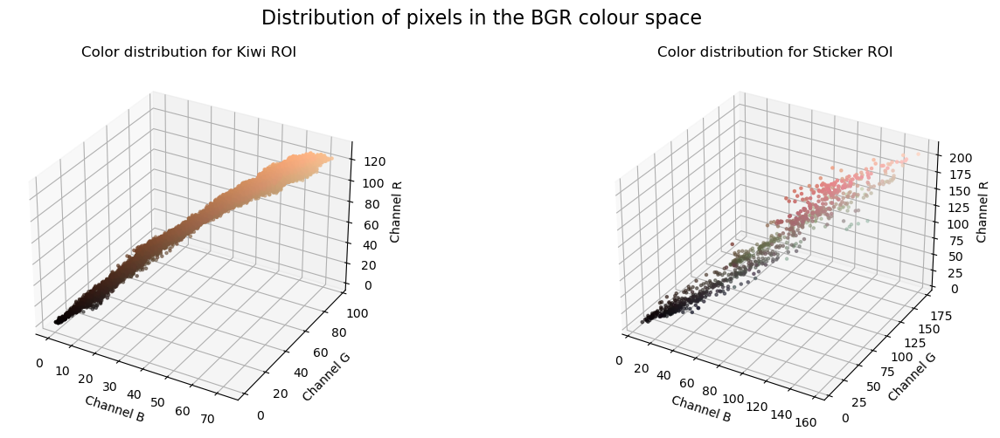

In [18]:
sticker_roi = masked_colour_imgs[0][115:150, 145:180]

plt.imshow(cv.cvtColor(sticker_roi, cv.COLOR_BGR2RGB))
plt.title('Sticker ROI')
plt.axis('off')
plt.show()

kiwi_roi = masked_colour_imgs[4]
sticker_roi_mask = (sticker_roi != 0)[:,:,0].astype(np.uint8)

plot_colour_distribution_3d([kiwi_roi, sticker_roi], ['Kiwi ROI', 'Sticker ROI'], ColourSpace('BGR'),
                           [masks[4], sticker_roi_mask])

In order to compute a colour reference of the kiwi, a series of samples are extracted from the kiwis regions in images *C1_000008* and *C1_000010* as they present the best separation from the background.

In particular, $200$ samples of size $20 \times 20$ are extracted from both kiwis.

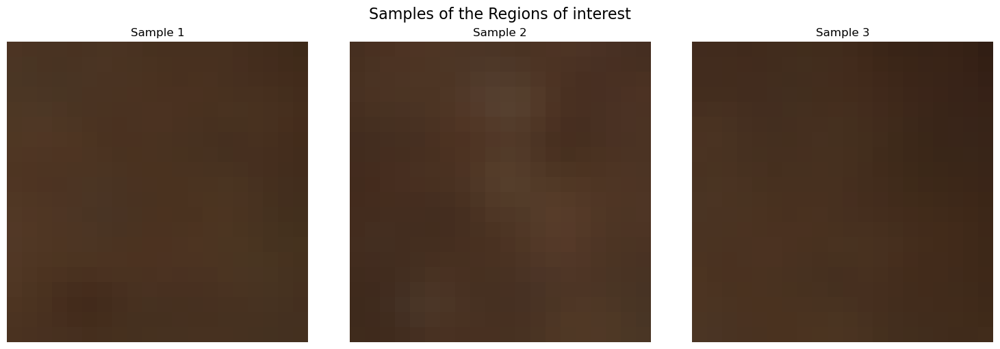

In [19]:
NUM_PATCHES = 200
PATCH_SIZE = 20

samples = get_roi_samples(masked_colour_imgs[2], NUM_PATCHES, PATCH_SIZE)
samples += get_roi_samples(masked_colour_imgs[4], NUM_PATCHES, PATCH_SIZE)

plot_image_grid([samples[0], samples[PATCH_SIZE], samples[PATCH_SIZE*2]], 
                [f'Sample {i}' for i in range(1,4)],
                'Samples of the Regions of interest')

The actual colour segmentation by considering the *Mahalanobis distance* from the refencence colour is performed. The *LAB* colour space with channels *A* and *B* is used for segmentation as it yielded the best results in the previous task.

The colour reference is estimated through the *mean* ($\mu$) and the *inverse covariance matrix* ($\Sigma^{-1}$) computed on the provided samples as in the previous task.

It is important to remark that that the calculation of $\Sigma^{-1}$ and $\mu$ are performed *offline*, hence the time needed to perform this operation is not taken into account.

Once the distance of each pixels from the reference colour is obtained and collected in a resulting image $I$, just the ones with a distance less or equal than a certain threshold $t$ can be classified as part of the kiwi, while the others are discarded.

Different thresholds $t$ ($5, 8, 9, 10$ and $11$) are considered and with $t = 10$, all of the pixels of the fruits are obtained for all images with a few false positives that correspond to the sticker region in image *C1_000006*. They can be removed by cleaning the masks.

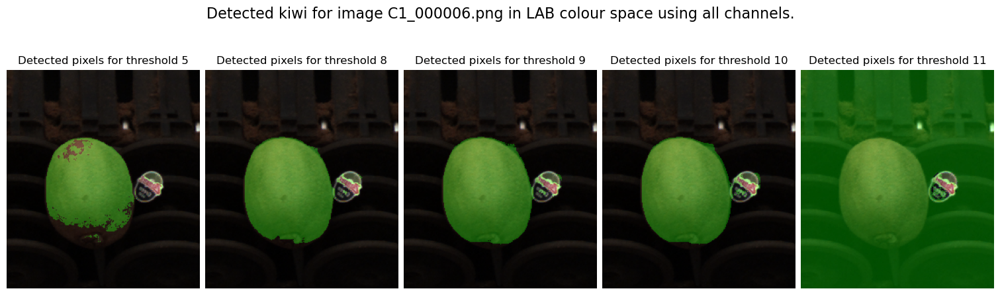

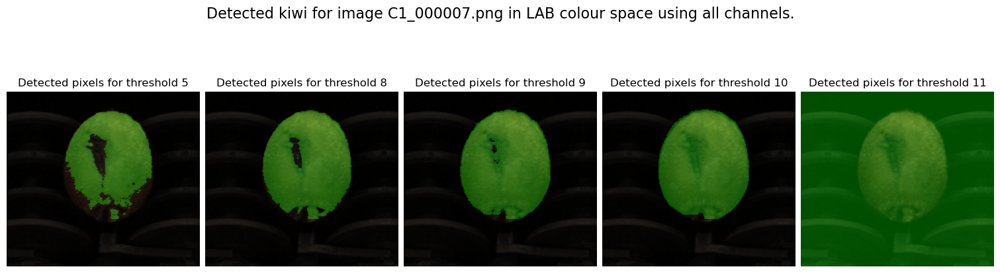

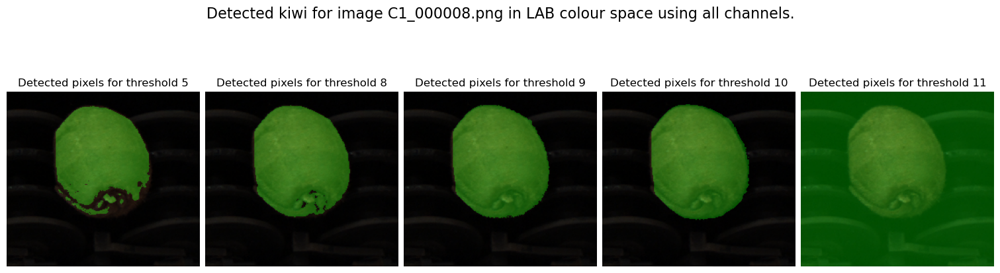

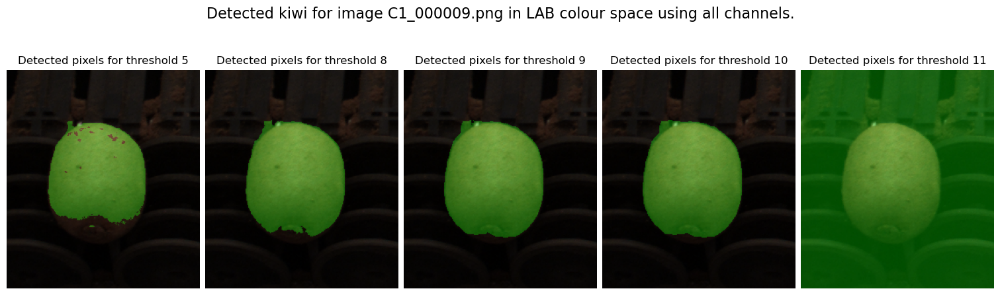

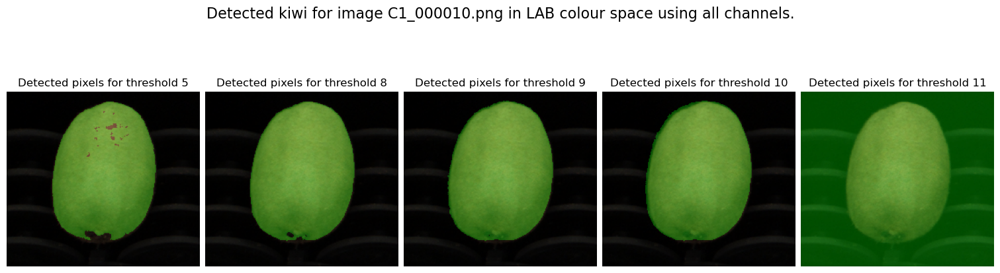

In [20]:
lab_colour_space = ColourSpace('LAB')

thresholds = [5, 8, 9, 10, 11]
mean, inv_cov = get_mean_and_inverse_covariance_matrix(samples, lab_colour_space, channels=(1, 2))
for img, c, n in zip(masked_colour_imgs, colour_imgs, colour_names):
    plot_mahalanobis_segmentation_comparisons(lab_colour_space.bgr_to_colour_space(img), c, mean, inv_cov, thresholds, 
                             f'Detected kiwi for image {n} in LAB colour space using all channels.', 
                             channels=(1, 2))

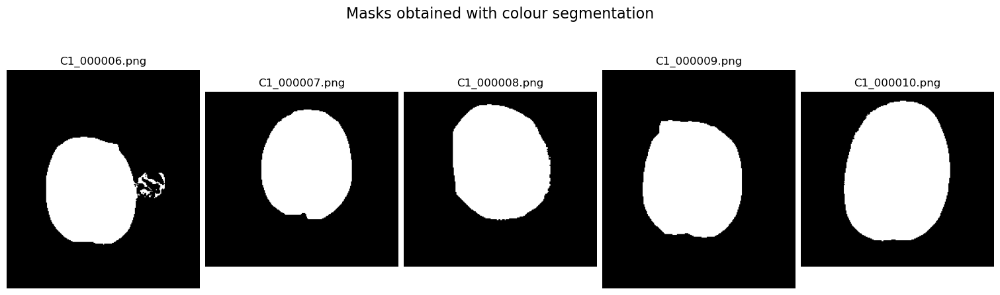

In [21]:
lab_imgs = [lab_colour_space.bgr_to_colour_space(img) for img in masked_colour_imgs]
masks = [get_mahalanobis_distance_segmented_image(img, mean, inv_cov, 10, (1, 2)) for img in lab_imgs]
plot_image_grid(masks, colour_names, 'Masks obtained with colour segmentation')

An opening is performed in order to clean the masks from the remaining sticker artefacts.

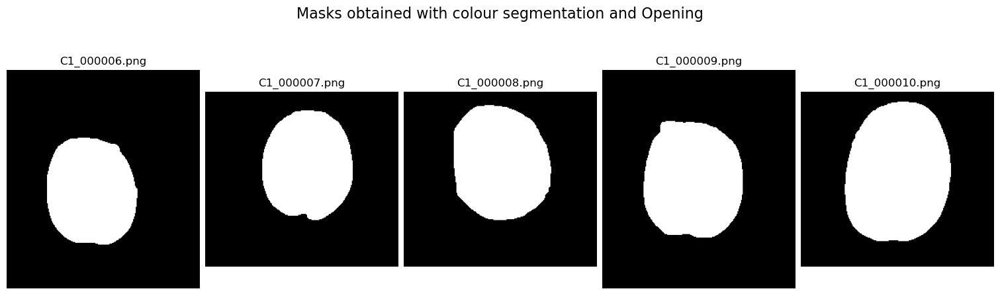

In [22]:
se = cv.getStructuringElement(cv.MORPH_ELLIPSE, (10,10))
masks = [cv.morphologyEx(m, cv.MORPH_OPEN, se) for m in masks]
plot_image_grid(masks, colour_names, 'Masks obtained with colour segmentation and Opening')

The masked NIR images are plotted below.

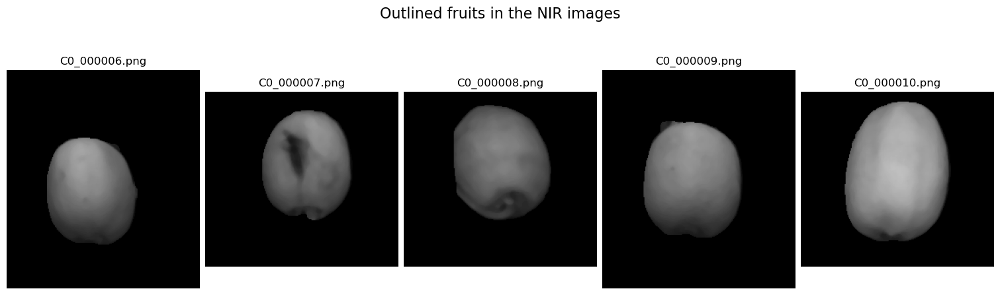

In [23]:
masked_nir_imgs = [apply_mask_to_image(img, m) for img, m in zip(filtered_nir_images, masks)]
plot_image_grid(masked_nir_imgs, nir_names, 'Outlined fruits in the NIR images')

The means and covariance matrices are saved in memory for future usages.

In [24]:
DATA_DIR = './data'
data_dir = os.makedirs(DATA_DIR, exist_ok=True)

np.save(f'{DATA_DIR}/mean_final_challenge', mean)
np.save(f'{DATA_DIR}/inv_cov_final_challenge', inv_cov)

## 04 Edge extraction
In order to extract the edges, *Canny's method* is applied to the filtered and masked Near Infra-Red images as in the *First task*.

An initial *Gaussian Smoothing* was, once again, manually applied with a value of $\sigma$ = 1 and a kernel size computed by a rule-of-thumb:
$$k = \left\lceil 3 \cdot \sigma \right\rceil$$
$$\text{kernel size} = (2 \cdot k + 1 \times 2 \cdot k + 1)$$

Regarding the *hysteresis* thresholds, the best results have been obtained with $t_h = 85$ and $t_l = 50$. 

Below, plots of the obtained edge masks for each fruit are shown.

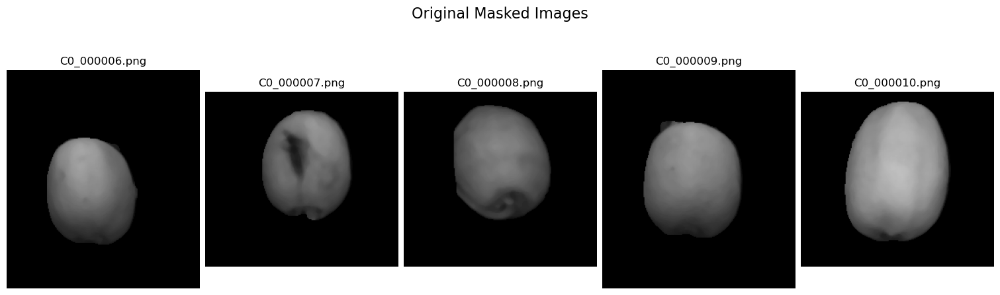

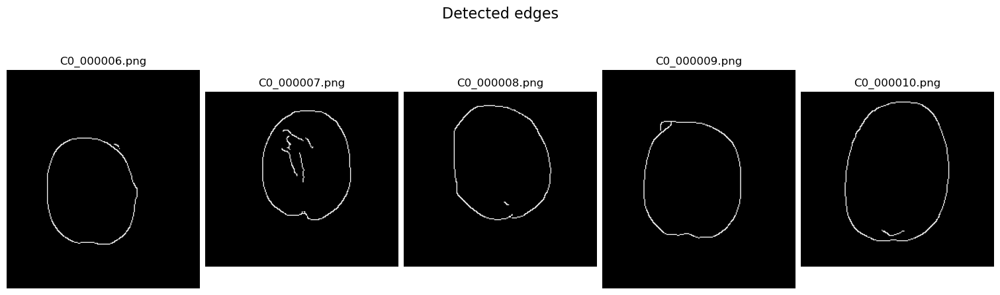

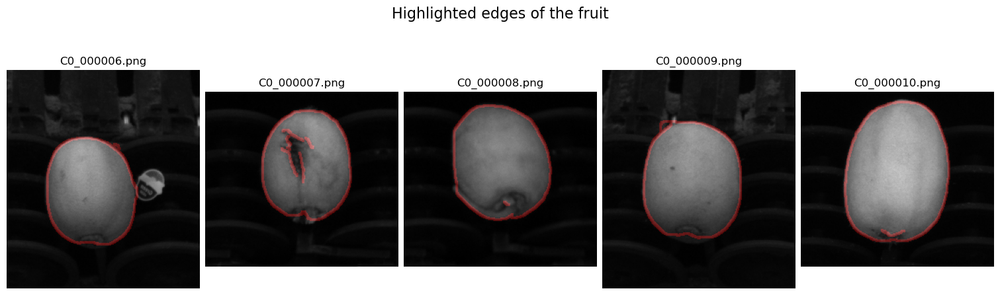

In [25]:
SIGMA = 1
THRESHOLD_1 = 50
THRESHOLD_2 = 85

edge_masks = [apply_gaussian_blur_and_canny(img, SIGMA, THRESHOLD_1, THRESHOLD_2) for img in masked_nir_imgs]
highlighted_edges_images = [get_highlighted_edges_on_image(img, e) for img, e in zip(nir_imgs, edge_masks)]

plot_image_grid(masked_nir_imgs, nir_names, 'Original Masked Images')
plot_image_grid(edge_masks, nir_names, 'Detected edges')
plot_image_grid(highlighted_edges_images, nir_names, 'Highlighted edges of the fruit')

To remove the edges along the border of the fruit the binary mask is eroded by a rectangular *structuring element* of size $15 \times 15$ and then applied over the edge mask as in the *First Task*

Thanks to this operation, solely the edges of the defects, along with some noisy artifacts, are preserved.

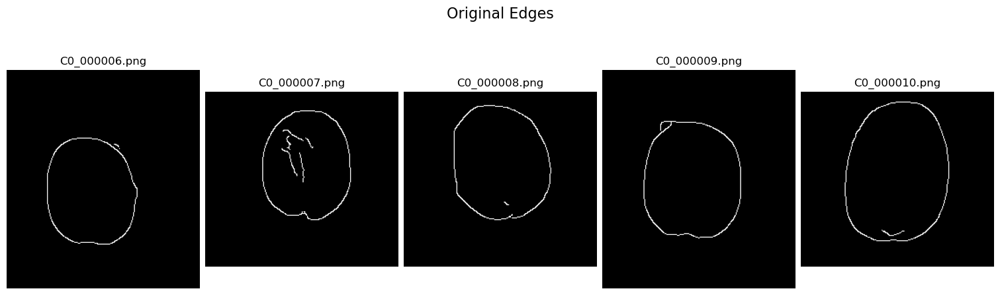

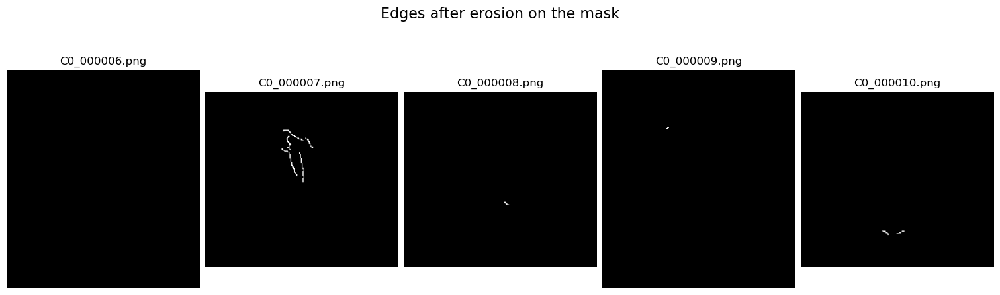

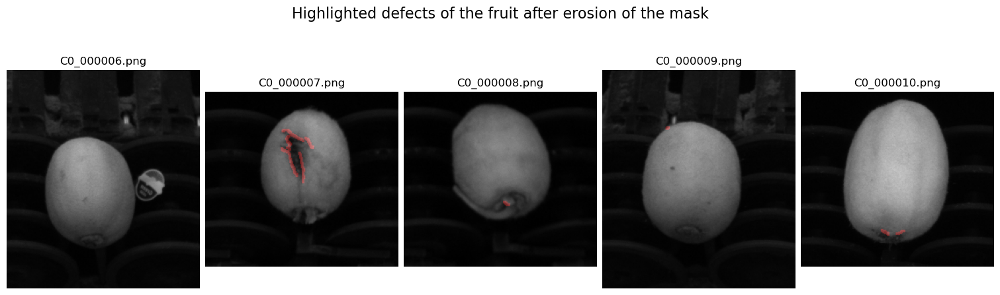

In [26]:
element = cv.getStructuringElement(cv.MORPH_ELLIPSE, (15, 15))
eroded_masks = [cv.erode(img, element) for img in masks]
eroded_edge_masks = [edge_masks[i] &  eroded_masks[i] for i in range(len(masks))]
highlighted_edges_images = [get_highlighted_edges_on_image(img, e) for img, e in zip(nir_imgs, eroded_edge_masks)]

plot_image_grid(edge_masks, nir_names, 'Original Edges')
plot_image_grid(eroded_edge_masks, nir_names, 'Edges after erosion on the mask')
plot_image_grid(highlighted_edges_images, nir_names, 'Highlighted defects of the fruit after erosion of the mask')

## 04.2 Defect edge filling
In order to fill the edges of the defects in the edge mask and obtain a blob in correspondence of each defect, a *Closing* operation with a circular structuring element of size $50 \times 50$ was applied.

The results are shown below. As it can be observed, the blobs in correspondence of the defects are obtained even if some noisy artifacts remain.

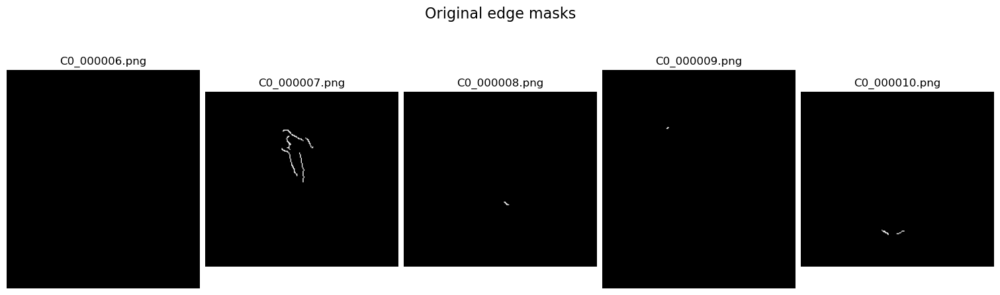

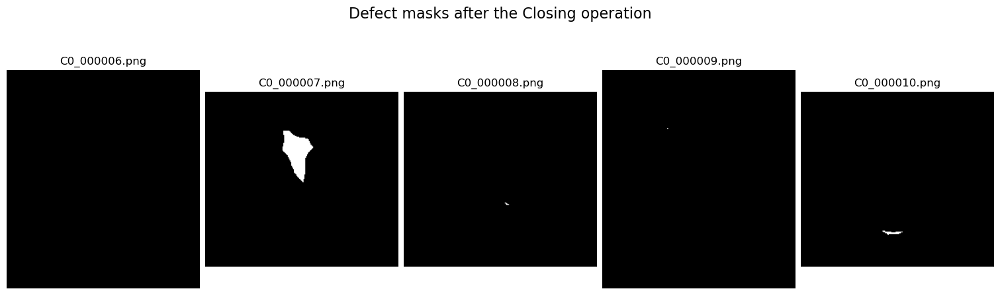

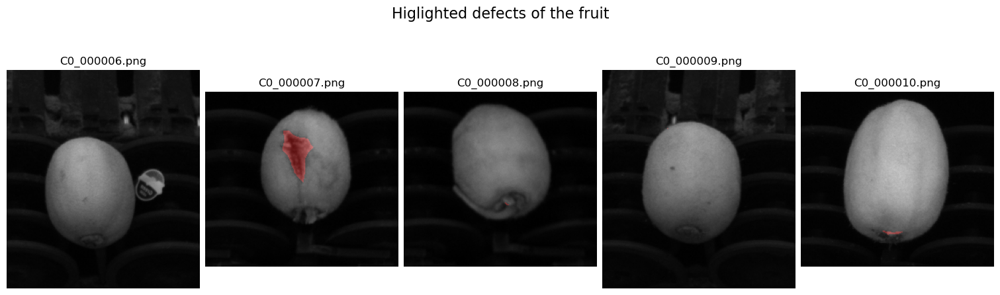

In [27]:
element = cv.getStructuringElement(cv.MORPH_ELLIPSE, (50, 50))
defect_masks = [cv.morphologyEx(img, cv.MORPH_CLOSE, element) for img in eroded_edge_masks]
highlighted_defects = [get_highlighted_roi_by_mask(img, e, 'red') for img, e in zip(nir_imgs, defect_masks)]

plot_image_grid(eroded_edge_masks, nir_names, 'Original edge masks')
plot_image_grid(defect_masks, nir_names, 'Defect masks after the Closing operation')
plot_image_grid(highlighted_defects, nir_names, 'Higlighted defects of the fruit')

To remove the noisy artifacts a *Median Blur* of kernel $7 \times 7$ is performed.

The final cleaned-up edge mask can be seen below.

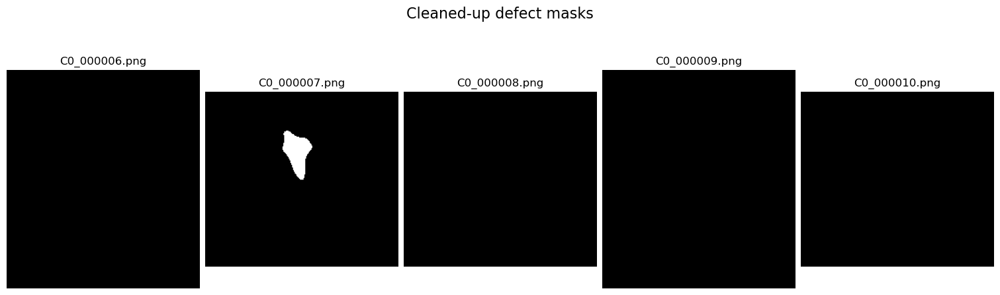

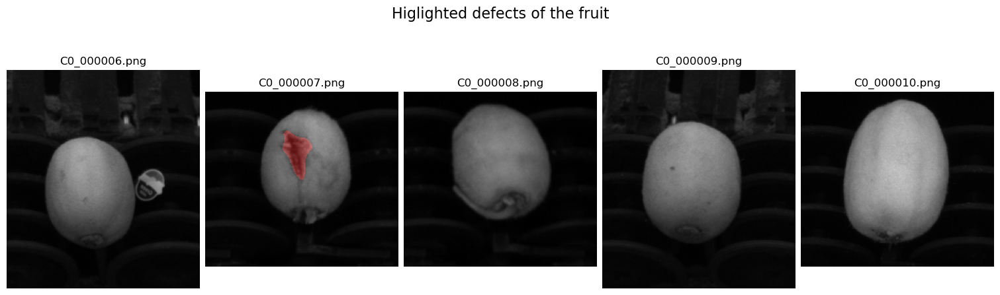

In [28]:
defect_masks = [cv.medianBlur(m, 7) for m in defect_masks]
highlighted_defects = [get_highlighted_roi_by_mask(img, e, 'red') for img, e in zip(nir_imgs, defect_masks)]

plot_image_grid(defect_masks, nir_names, 'Cleaned-up defect masks')
plot_image_grid(highlighted_defects, nir_names, 'Higlighted defects of the fruit')

## 05 Results
An algorithm performing the steps described above is built in `src/execute_final_challenge.py` and it can be executed via command line or by the method `detect_defects`. 

The algorithm:
- Filters the NIR image by *Median Blur* with a kernel $7 \times 7$;
- Filters the colour image by a *Bilateral filter* using kernel of dimension $(7 \times 7)$ and spatial standard deviation ($\sigma_s$) and intensity standard deviation ($\sigma_r$) equal to $75$;
- Applies *Tweaked Otsu's Algorithm* to obtain the segmented fruit;
- Performs two openings through ellipses to clean up the masks
- Applies the mask over the filtered colour image;
- Turns the masked colour image to the LAB colour space;
- Gets a fruit mask by applying colour segmentation with respect to the colour reference of the fruit colour;
- Uses *Canny's Algorithm* by firstly blurring the masked image through *Gaussian Blur*;
- It obtains the defect blobs by the edge mask and removes the noisy artifacts;
- Shows the blobs of the defects, counts their occurrences and highlights their position through ellipses;
- Returns statistics about the defects.


In [29]:
mean_final_challege = np.load(f'{DATA_DIR}/mean_final_challenge.npy')
inv_cov_final_challege = np.load(f'{DATA_DIR}/inv_cov_final_challenge.npy')

Once again, it can be observed that the result on the given images are pretty satisfactory.

Detected 0 defects for image C1_000006.png.


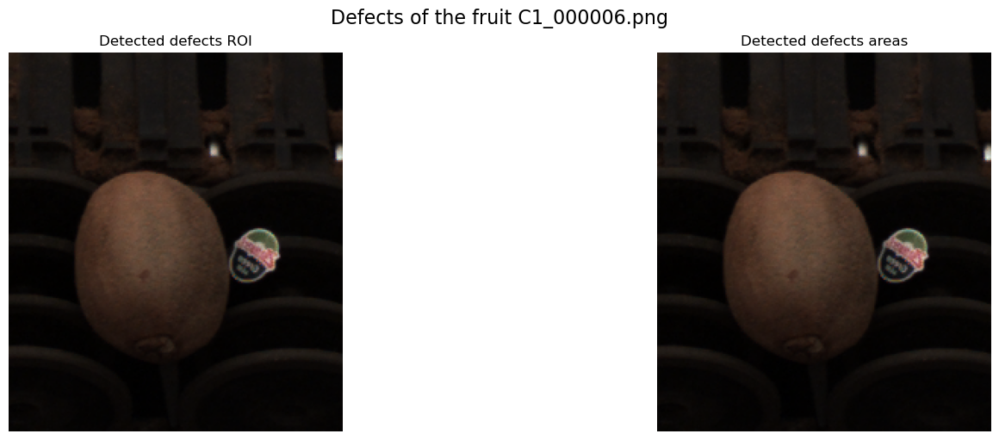

Detected 1 defect for image C1_000007.png.


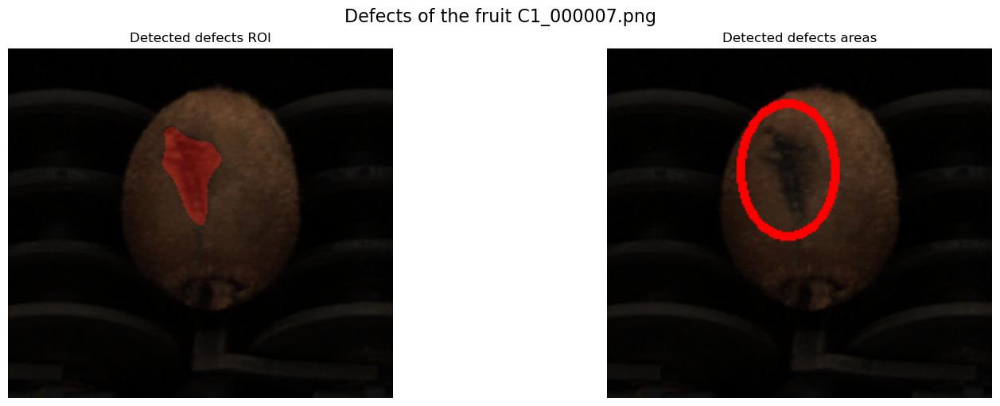

Detected 0 defects for image C1_000008.png.


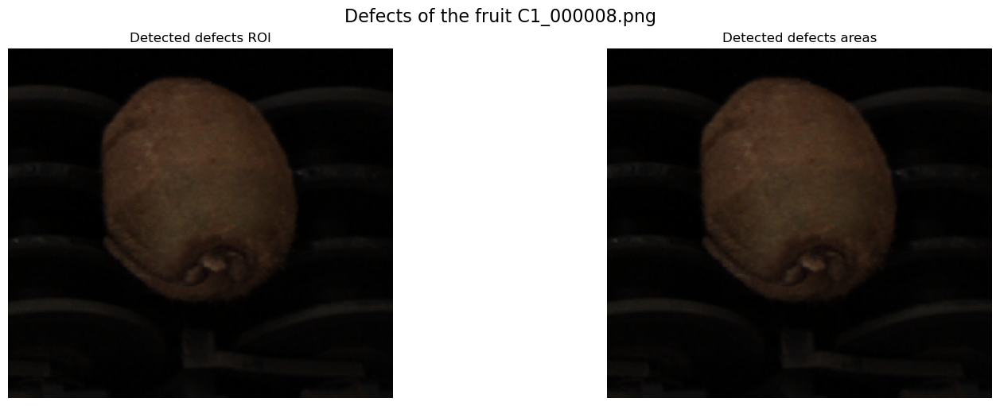

Detected 0 defects for image C1_000009.png.


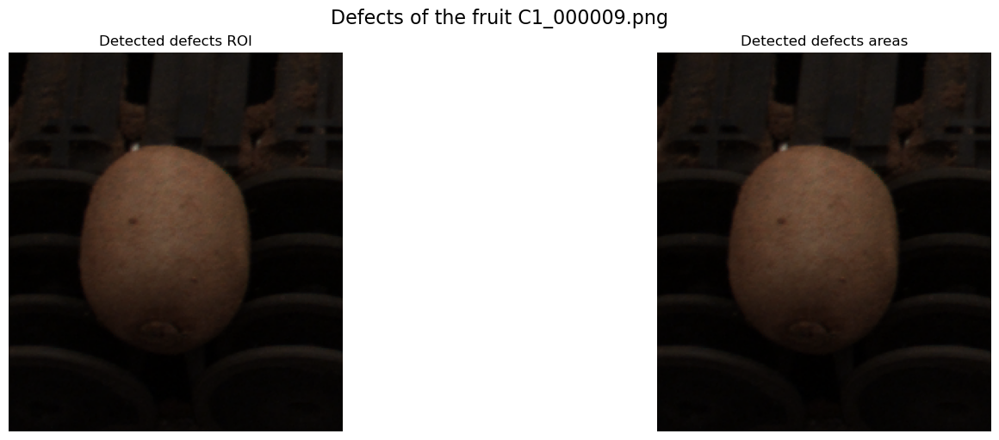

Detected 0 defects for image C1_000010.png.


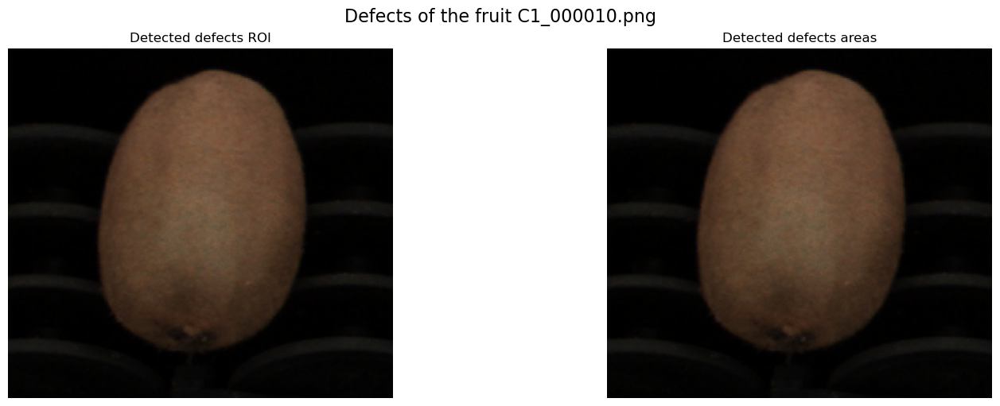

In [30]:
for col, nir, n in zip (colour_imgs, nir_imgs, colour_names):
    detect_defects(col, nir, tweak_factor=TWEAK_FACTOR, sigma=SIGMA, threshold_1=THRESHOLD_1, 
                   threshold_2=THRESHOLD_2, mean=mean_final_challege, inv_cov=inv_cov_final_challege, image_name=n)

Finally, the time for detecting the defect is computed by applying the `detect_defects` project on each image $1,000$ times, for a total of $5,000$ executions. 

The algorithm is fast, as it can detect the defects of an image with a mean time of $\approx 0.02$ seconds.

In [31]:
s = time()

for col, nir, name in list(zip(colour_imgs, nir_imgs, colour_names)) * 1_000:
    detect_defects(col, nir, image_name=name, tweak_factor=TWEAK_FACTOR, sigma=SIGMA,
                   threshold_1=THRESHOLD_1, threshold_2=THRESHOLD_2, mean=mean_final_challege, inv_cov=inv_cov_final_challege, verbose=False)

total_time = time() - s

In [32]:
print(f'Time for analizing {1_000 * len(colour_imgs)} images of fruits: {total_time:.6f}')
print(f'Mean time for analizing an image of a fruit: {(total_time / (1_000 * len(colour_imgs))):.6f}')

Time for analizing 5000 images of fruits: 95.616971
Mean time for analizing an image of a fruit: 0.019123


## 05.1 Portability
As for the *russet detection system* designed in the *Second Task*, this newly built *defect detection system* cannot be ported to other industrial setings by simply changing some of its parameters.

Small changes of illumination can in fact affect the colour distribution of the images and the mean and inverse covariance matrix of the kiwi reference colour have to be manually recomputed with respect to the given environment. 